# `Материалы кафедры ММП факультета ВМК МГУ. Введение в глубокое обучение.`

# `Лекция 03. Сверточные нейронные сети. Transfer learning`

### `Материалы составили Оганов Александр (@welmud), Находнов Максим (nakhodnov17@gmail.com)  Глеб Афанасьев, Варламова Арина`

#### `Москва, Весенний семестр 2025`

`Материалы`

- Часть изображений взята из [лекции ВМК ММП, курса "Глубокое обучение"](https://github.com/Dyakonov/DL/blob/47f2efbadfd15f8d0a5f5cb209386aba64326eb6/2022/DL_2CV_07visualgeneration_202203a.pdf)
- Часть изображений взята из [лекции ФКН, курса "Введение в ГО"](https://github.com/isadrtdinov/intro-to-dl-hse/blob/1fd3f9bf82fc7aa8e0475210318423559f02f582/lecture-notes/notes-05-cnn.pdf)

Наша сегодняшняя задача - разобраться, **как обучать нейросети для классификации изображений**. Мы разберём как прийти от самой простой полносвязанной модели к архитектурам, которые используются до сих пор.

## `Операция свертки`

#### `Мотивация`

В прошлом семестре вы уже обучали модели для классификации изображений (распознавания цифр). Давайте вспомним, какие приёмы мы использовали для повышения качества?

Одним из основных способов было увеличение выборки (аугментации) с помощью поворотов, сдвигов и много других техник, но мы всегда предполагали, что наши **изменения данных не влияют** на класс. 

Например, если немного сдвинуть изображения цифры, то человек все еще сможет распознать, что именно изображено, именно на таких предположениях мы строили аугментации. **Правильная аугментация не должна изменять класс.** Мы уже поняли, что такое "правильная", но для полноты картины нам важно понять, что такое "неправильная" аугментация, или разобрать примеры.

Примеры **"неправильных" аугментаций**:

- Отражение цифр,
- Поворот текста,
- Изменение контрастности еды,


В целом, когда говорят об изображениях, всегда предполагают "правильность" аугментации сдвигами или, иными словами `инвариантность относительно сдвигов`. Это предположение разумно, так как сдвиг пикселей не должен менять класс объекта. Мы бы хотели, чтобы модель училась распознавать объекты независимо от их пространственных координат: яблоко не перестанет быть яблоком, если мы его сдвинем чуть влево перед фотографией.

Раньше мы закладывали наши знания о данных (априорные знания) в аугментации, тем самым добавляли некую регуляризацию и пытались избавиться от переобучения, так как чем больше выборка, тем лучше обобщающая способность модели и меньше переобучение. Такой подход действительно был оправдан, но давайте вспомним, как ещё люди старались улучшить качество классификации в машинном обучении?

Стандартные приёмы в обработке изображений:
- Поиск и подсчёт геометрических фигур
- Фильтры (размытие, выделение границ и т.д.)
- Преобразование Фурье
- Морфологические операции
- Сжатие, пирамиды Лапласа
- Многое другое, что имеется в OpenCV

Вся область до появления нейронных сетей подбирала всё более сложные и интересные признаки, которые можно извлечь из изображения для более точной классификации. Что же поменялось? Чего смогли сделать нейронные сети, что не получалось в классическом машинном обучении?

Ранее мы говорили, что нейросети можно рассматривать как последовательное извлечение всё более сложных признаков. Так что выйдет, если мы обучим полносвязанные глубокие нейронные сети для классификации изображений?


Выше мы говорили, что учёт априорных знаний (например, аугментаций) сильно помогает в проблеме переобучения, так как модель извлекает более естественные и осмысленные признаки. Если классическое машинное обучение закладывало знания о данных в извлечении фичей для модели, а нейронные сети идейно сами извлекают признаки, то нам следует придумать блоки или даже целые архитектуры, которые учитывают структуру изображений (априорные знания). Когда мы заранее в алгоритм вносим какие-то знания, то закладываем некое индуктивное смещение (`Inductive bias`) в процесс обучения.

Наша цель - понять или придумать (если вы еще не знаете), как в современных архитектурах нейронных сетей используется `inductive bias` на примере классификации изображений, а может и в других доменах.

Выше мы уже выяснили, что самое универсальное требование к извлекаемым фичам - `инвариатность относительно сдвига`. Как вы думаете, какие методы получения фичей из классического машинного обучения обладают этим свойством?

К сожалению, методов **инвариантных** относительно сдвига у нас нет в наличии, так как для **инвариантности** требуется слишком много. Попробуем ослабить это свойство, для этого формально запишем наши требования.

**Определение:**

Пусть есть какое-то действие $g$ на объект $x$, тогда под **инвариантностью** функции $f$ относительно $g$ мы понимаем следующее:

$$
\begin{gather*}
f(g \circ x) = f(x)
\end{gather*}
$$

На практике же мы хотим, чтобы извлекаемые фичи были бы "согласованы" со входом, то есть хотим **эквивариантность (equivariant)**. 




**Определение:**

Пусть есть какое-то действие $g$ на объект $x$, тогда под **эквивариантностью** функции $f$ относительно $g$ мы понимаем следующее:

$$
\begin{gather*}
f(g \circ x) = g \circ f(x)
\end{gather*}
$$

Выше мы рассмотрели определения для конкретного действия $g$, например, сдвига на 1 пиксель влево, но чаще всего нас интересует семейство действий. В математике для описания семейств объектов одной природы используется понятие группы, поэтому определение **эквивариантности** можно записать так.




**Определение:**

Пусть есть группа $G$ и определено действие на элементы множества $X$, тогда под **эквивариантностью** функции $f$ относительно $G$ мы понимаем следующее:

$$
\begin{gather*}
f(g \circ x) = g \circ f(x), \quad \forall g \in G, \forall x \in X
\end{gather*}
$$



Если мы рассмотрим множество всех изображений, то сдвиги, повороты, отражения будут образовывать группу. Мы не будем формально проверять свойства групповых операций и оставим это любопытному читателю. Заметим важное для нас утверждение.

**Утверждение:**

Композиция эквивариантных функций является **эквивариантной** функцией.

Для нас это значит, что последовательное применение **эквивариантных** слоев реализует **эквивариантную** функцию, значит мы можем достаточно просто собирать **эквивариантные** нейросети.

**Вопрос:** Какие методы получения фичей из классического машинного обучения обладают **эквивариатны относительно сдвига**?

Самым **простым методом** эквивариантным относительно сдвига являются фильтры, то есть базовую идею можно озвучить так: 

1) Мы хотим обучать модель, чтобы извлекаемые фичи были эквивариантны относительно сдвига.

2) Мы можем заложить эти знания в аугментацию выборки, а можем в архитектуру, алгоритм обучения, то есть добавить `inductive bias`.

3) Мы знаем, что уже есть фильтры, они достаточно выразительны (могут выделять границы, размывать и тд).

4) Мы можем использовать в качестве базового блока не линейный слой, который не эквивариантен относительно сдвига, а обучаемый фильтр.

5) Обучая фильтры можно будет извлекать все более сложные эквивариантные относительно сдвига признаки

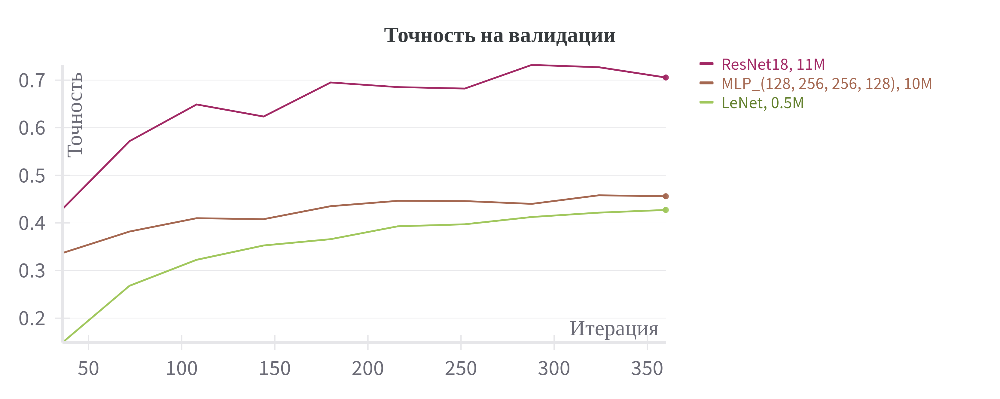

На рисунке выше представлены три модели для классификации датасета `Imagenette`; все параметры обучения кроме архитектуры модели **были зафиксированы**. 

- `LeNet` - сверточная архитектура с 0,5 миллиона обучаемых параметров.
- `ResNet18` - сверточная архитектура с 11 миллионами обучаемых параметров.
- `MLP_*` - полносвязанная архитектура с 10 миллионами обучаемых параметров.

По графикам мы видим, что даже маленькая сверточная сеть `LeNet`, при числе параметров в 20 раз меньше, может получить качество сравнимое с `MLP`. При этом сверточная архитектура `ResNet18` со схожим числом параметров показывает качество заметно лучше, чем `MLP`. Из этих графиков мы можем сделать вывод, что сверточные архитектуры при меньшем числе параметров работают лучше, чем полносвязные нейросети при решении задачи классификации изображений. Подробнее про получении и воспроизведении результатов можно узнать на семинаре.

#### `Сверточный слой`

####  `Примеры фильтров`

Много примеров было рассмотрено в [осеннем семестре](https://github.com/mmp-practicum-team/mmp_practicum_fall_2023/blob/master/Seminars/04-image-processing-and-KNN/Seminar_4_cv_msu.ipynb). Поиграться с различными фильтрами [можно тут](https://setosa.io/ev/image-kernels/).

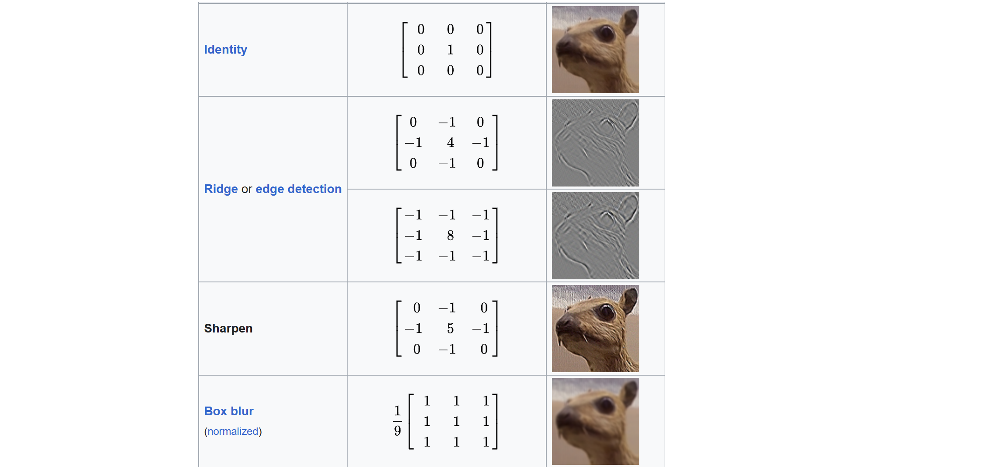

#### `Фильтры в PyTorch`

В нейронных сетях **обучаемые фильтры принято называть свертками**. Сначала постараемся понять самое простое: как происходит `forward pass`.

**Свертка 2D изображения** - агрегация данных об интенсивности пикселей на изображении в соответствии с определенным набором правил.



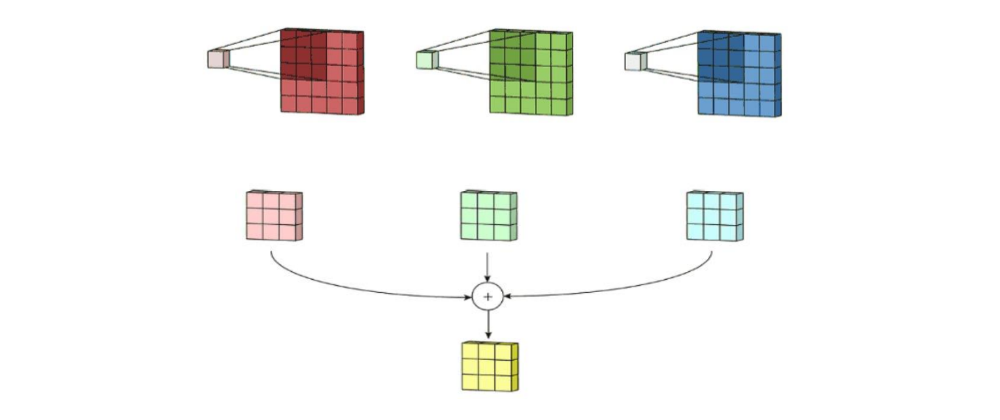

**Пример:** Операция свертки многоканального изображения $U$ с ядром $K$:

$
\begin{align*}
&V(x,y,t) = \sum\limits_{i=x-\delta}^{x-\delta} \sum\limits_{j=y-\delta}^{y-\delta}\sum\limits_{s=1}^{S} K(i-x+\delta,j-y+\delta,s,t)U(i,j,s),\\
&U \in \mathbb{R}^{W \times H \times S}, \quad V \in \mathbb{R}^{W' \times H' \times T}, \quad K \in \mathbb{R}^{k \times k \times S \times T}, \quad k = 2 \delta + 1.
\end{align*}
$

Заметим, что свертка $K$ это **не матрица**, а **тензор**! 

Посмотрим на это выражение подробнее, и постараемся понять какие размерности у $K$, $U$ и результата $V$. 

- $U$ обозначает наше изображение c $S$ каналами, индиксируясь по $(i, j)$ и фиксированном $s$ мы проходим по всем пикселям отдельного канала. При фиксированных $(i, j)$ и итерируясь по $s$ мы смотрим на изменение пикселя по каналам

- $V$ это получаемое изображение с $T$ каналами.

- $K$ ядро, которая преобразует изображение с $S$ каналами в изображение c $T$ каналами и ядром размера $k$.


**Вопрос:** Как будет выглядеть свертка, которая преобразует RGB изображение в ЧБ?

**Вопрос:** Как будет выглядеть свертка, которая добавляет новый канал, равный сумме красного и зеленого?

**Вопрос:** Сколько обучаемых параметров у свертки $K$?

##### `Параметры сверточного слоя`

Сначала нам стоит ответить на **вопрос:** Что мы хотим от сверток? Какие именно признаки мы хотим извлекать? Так как именно от ответа будут зависеть параметры, которые мы опишем ниже.


Все параметры можно разделить на 2 группы.


**Параметры размерности свертки**


- **kernel_size:** Отвечает за размер ядра, например при **kernel_size=3** мы будем рассматривать свертки с ядром порядка 3, то есть будем агрегировать 9 пикселей с канала.

- **in_channels:** Соответствует числу каналов изображения $U$.

- **out_channels:** Соответствует числу каналов результата $K$.

**Вопрос:** Каким должен быть размер ядра, если мы хотим учитывать **локальные** свойства изображения? 

**Вопрос:** Каким должен быть размер ядра, если мы хотим учитывать **глобальные** свойства изображения? 

На практике оказывается, что каждый канал является хорошей фичей (признаком), аналогично элементам в скрытом состоянии MLP. Так как мы хотим использовать больше признаков, то часто свертки берут достаточно широкими (128, 256 каналов), то есть на практике **in_channels** и **out_channels** берут по аналогии с **in_features** и **out_features**.

Такая интуиция работает, так как мы можем рассматривать свертку как линейные слои для окрестности пикселя, то есть с каждым слоя мы все больше уточняем признаки (**feature map**).

**Параметры применения свертки**

- **Stride:** Определяет шаг, с которым ядро свертки проходит по матрице

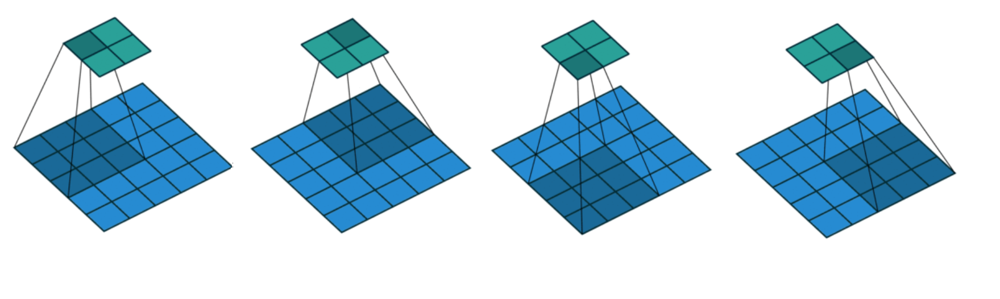

- **Dilation**

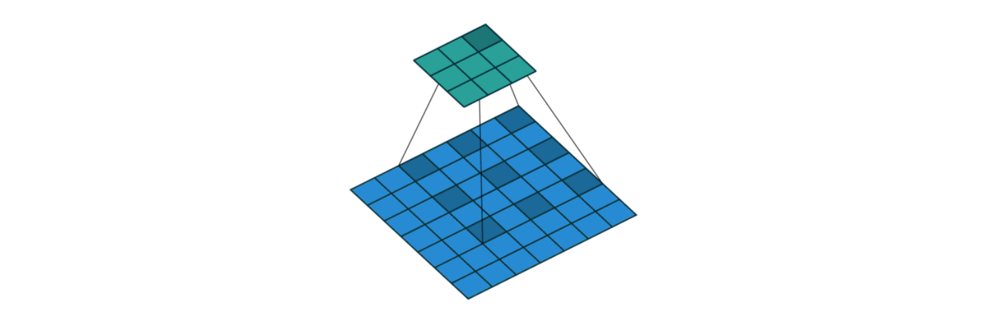

- **Padding** 

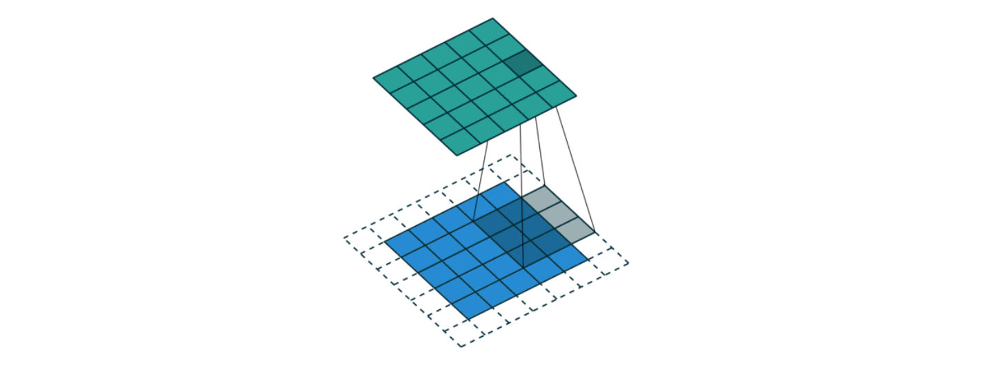

[Источник визуализаций](https://github.com/vdumoulin/conv_arithmetic/blob/af6f818b0bb396c26da79899554682a8a499101d/README.md)

Одной из главных проблем на практике является определение размеров изображения после применения свертки, подробнее мы поговорим об этом на семинаре.

#### `Рецептивное поле (Receptive field)`

**Receptive field** - размер части изображения, которая влияет на значение нейрона спустя несколько слоев. Иными словами, зона покрытия изображения нейроном.

Примеры:

1) При использовании полносвязного слоя **receptive field** совпадает с размером изображение

2) При применении одной свертки с ядром 3 **receptive field** равен $3\times3$.

2) При применении двух последовательных сверток с ядром 3 **receptive field** равен $5\times5$.

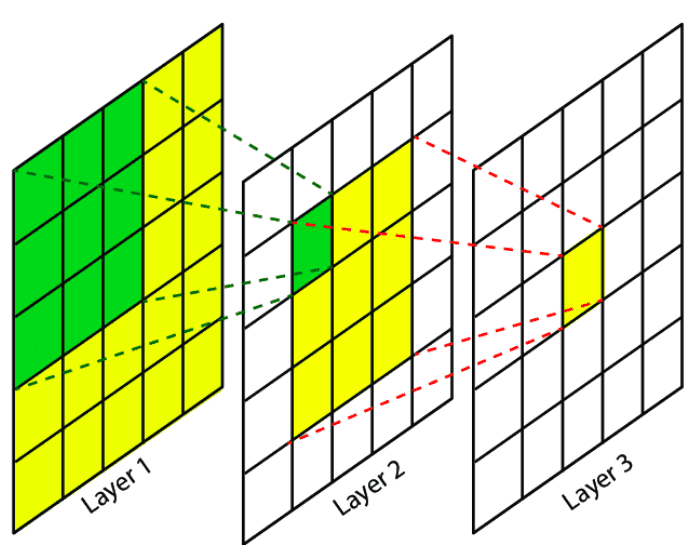

Получаем следующее **правило**: 

1) Чем больше сверточных слоев или чем больше **stride**/**dilation** у сверток, тем больше **receptive field**.

2) Чем больше **receptive field** у нейрона, тем больше **глобальных признаков** (свойств изображения) он знает.

#### `Pooling Layers`

Как увеличить **receptive field**?

1) Больше сверточных слоев.
2) Увеличить **stride** и/или **dilation** отдельных сверток.
3) Использовать **Poling**.

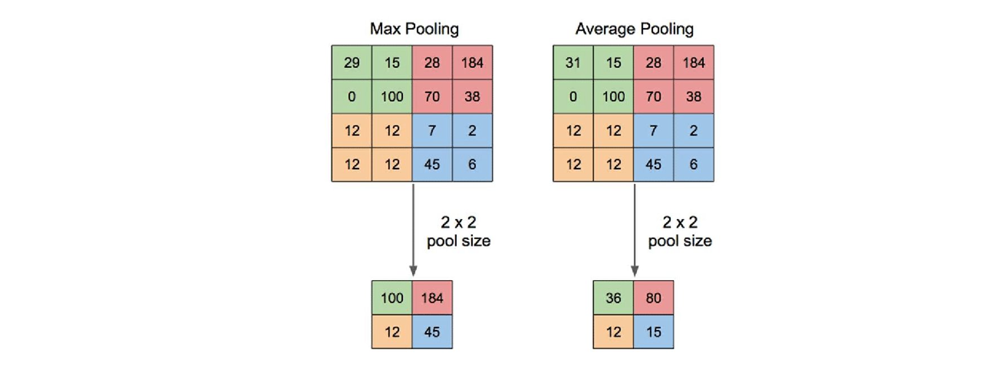

**Pooling** слои позволяют увеличить зону покрытия, при этом не добавляя обучающих параметров. Кроме того, слои пулинга не приводят к затуханию градиентов, то есть мы можем сделать более глубокую нейросеть. Такая техника являет  **legacy** более старых архитектур, современные подходы используют параметр **stride** для достижения похожего эффекта.

**Вопрос:** Какие веса и параметр **stride** должен быть у сверточного слоя, чтобы он работал эквивалентно **average pooling**?

#### `Реализации сверток`

Внутри свертки реализованы сильно хитрее с многими оптимизациями, но какой именно алгоритм и библиотека используется в реализации, зависит от каждого отдельного случая. 

Возможные реализации свертки:

1) Матричных умножения: через сведение к [GEMM](https://spatial-lang.org/gemm) и использованию оптимизированных библиотек линейной алгебры

2) [Winograd](https://discuss.pytorch.org/t/why-does-winograd-algorithm-speedup-convolution-given-that-mul-and-add-cost-the-same-clock-cycles-on-gpu/89993/4): алгоритм для сверток размером $3 \times 3$ 

3) FFT (Fast Fourier Transform): для сверток больших размеров

Для использования наиболее подходящего алгоритма под вашу задачу и систему стоит использовать ([подробнее тут](https://discuss.pytorch.org/t/what-does-torch-backends-cudnn-benchmark-do/5936)):

```python
torch.backends.cudnn.benchmark = True
```

Обратим внимание, что свертки часто реализуются через матричные умножения, через которые можно очень просто и эффективно делать `backward`.

Мы не будем подробно разбирать реализации и эффективные подходы, так как это достаточно трудная и отдельная задача. Что для нас важно, что мы пользуемся некой абстракцией, которая может быть реализована через совершенно разные алгоритмы под капотом. За этим следуют некие **проблемы воспроизводимости**, что будет для нас крайне важно, об этом подробнее поговорим на семинаре.

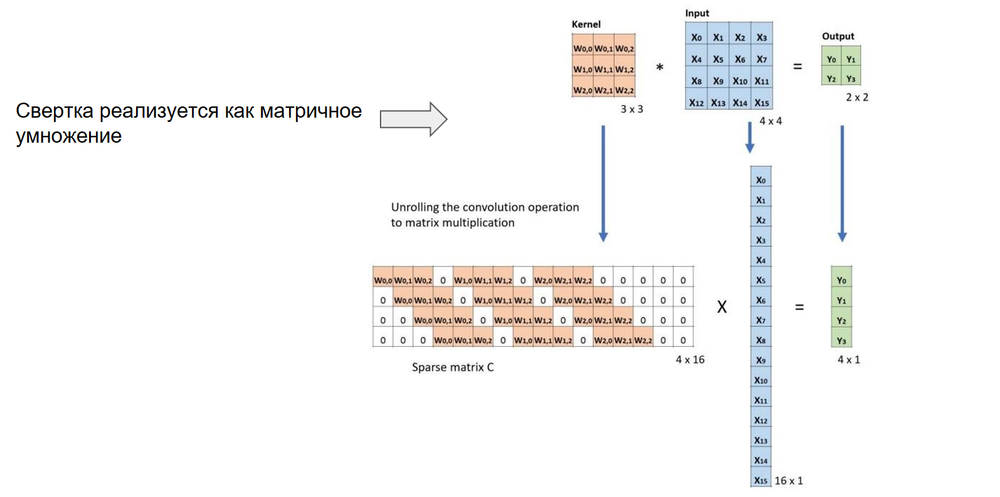

### `Что исследовалось, когда появились сверточные нейросети?`

#### `Чувствительность к маскированию (окклюзия изображений)`

[Zeiler and Fergus, 2013](https://arxiv.org/abs/1311.2901)

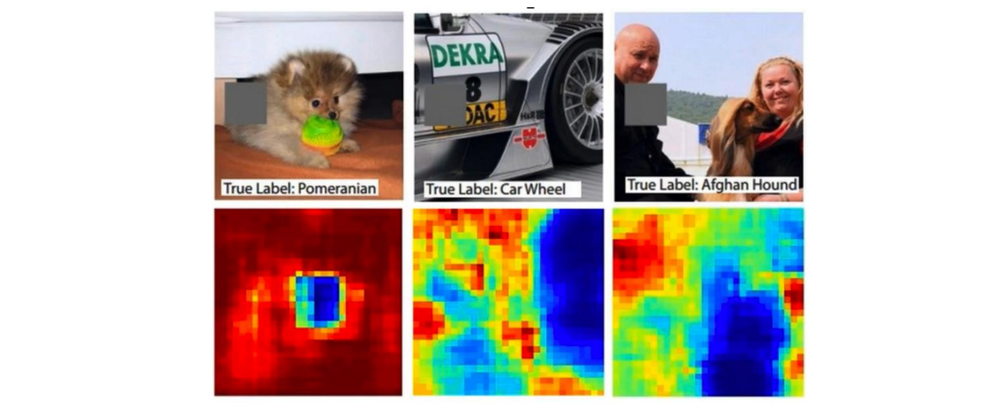

#### `Чувствительность фильтров`

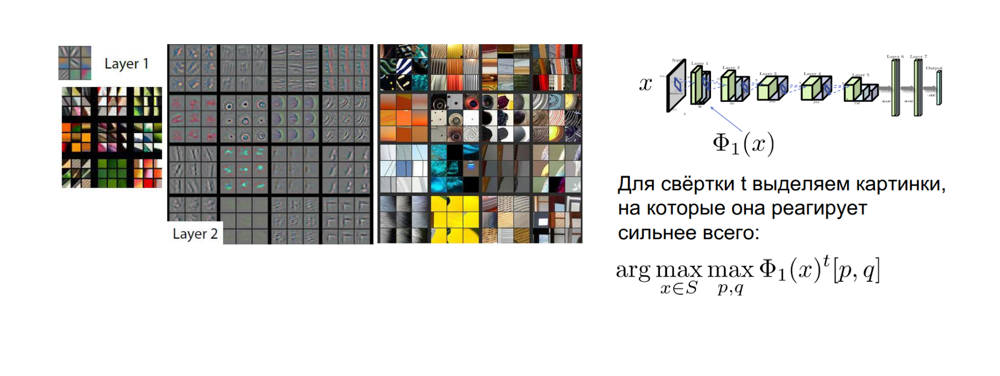

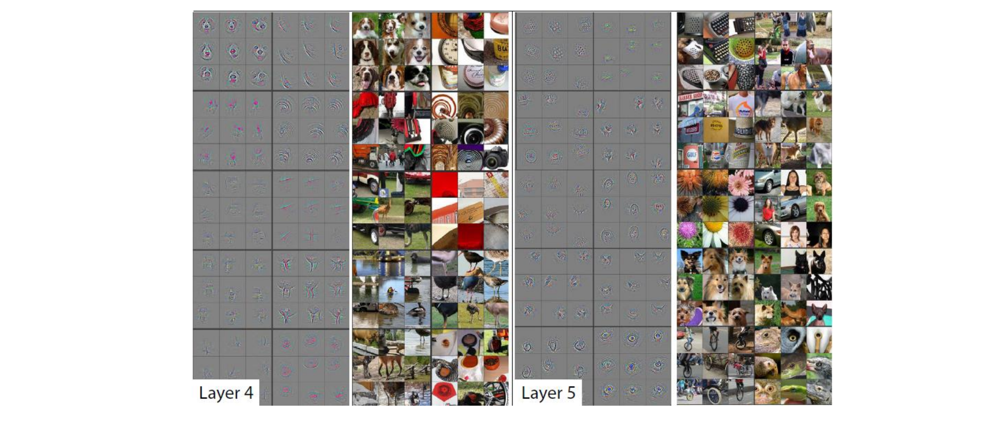

### `Основные моменты`

- Операция свертки эквивариатна относительно сдвигов, то есть закладывает `inductive bias` в нашу модель
- В случае сверточного слоя аналогом размерности скрытых состояний является число каналов `feature map`
- При работе со свертками мы извлекаем признаки локально и глобально в зависимости от **receptive field**
- Мы можем добавить pooling слои для увеличения **receptive field** или брать свертки с большим **stride** 
- В PyTorch есть разные реализации в зависимости от системы, что влияет на воспроизводимость

## `Сверточные архитектуры`

Разговаривать об архитектурах можно долго, много и сложно, но наша цель чуть другая. Мы не собираемся разобраться в каждой модели из зоопарка (действительно есть [model zoo](https://modelzoo.co/)), мы хотим понять какие проблемы стояли и какие идеи позволили их решить или чуть схитрить.

Мы часто будем обращаться к **основному принципу** глубокого обучения: "чем больше слоев, тем лучше" или иными словами **stack more layers**.

#### `Самая простая схема сверточной сети для классификации`

Выше мы описали базовые слои (сверточный, pooling) из которых будем собирать нейронную сеть. Мы можем, например, собрать сверточный блок, добавить нелинейности и потом pooling. После некого количества таких слоев мы получим карту признаков (`feature map`), дальше можно сделать стандартный однослойный классификатор. При таком подходе мы благодаря сверточным сетям извлечем хорошие признаки и будем обучать на них логистическую регрессию.

**Вопрос:** Почему между сверточными слоями мы не используем полносвязные блоки? Благодаря этому мы могли бы повысить **receptive field**?

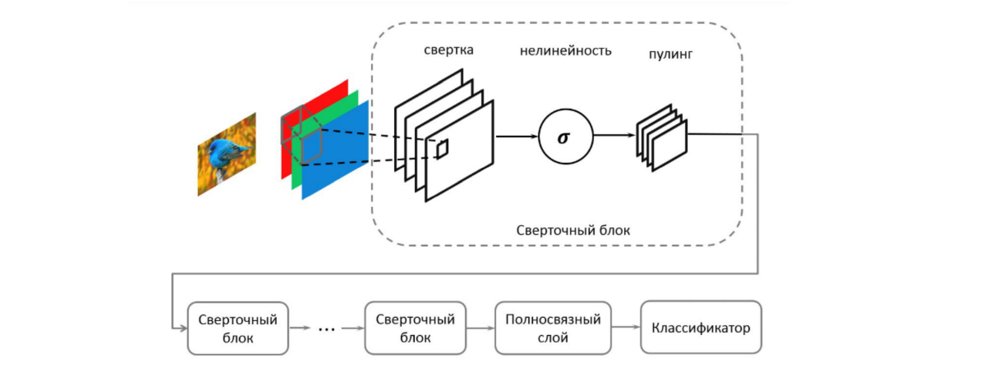

#### `LeNet (1998)`  

[Le et al., 1998](https://ieeexplore.ieee.org/abstract/document/726791)

Первая сверточная появилась достаточно давно и чем-то соответствовала схеме предложенной выше.

- Сверточные слои и слои Subsampling (pooling) 
- В качестве функций активации взяты `Sigmoid`
- В качестве головы полносвязаные слои
- Работает для изображений фиксированного размера

**Вопрос:** Какие проблемы вы видите?

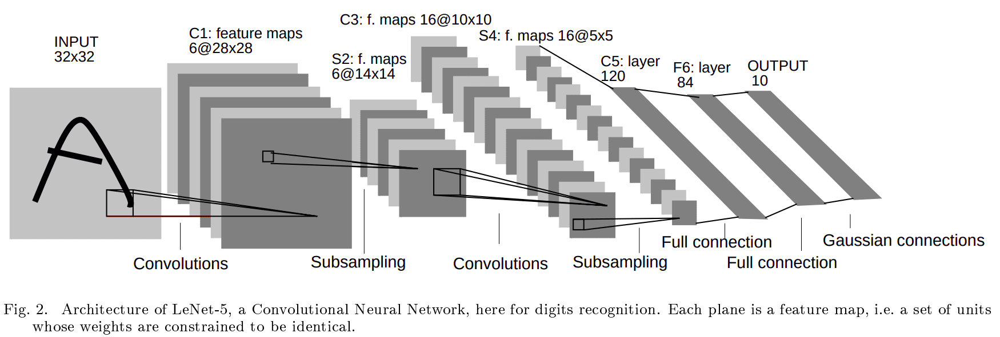

**Вопрос:** Выше мы предложили архитектуру, вроде бы, она даже выглядит разумно, теперь рассмотрели архитектуру `LeNet`, как нам понять что лучше?



**Проблема:** Мы не умеем сравнивать архитектуры между собой, необходима некая единая сложная задача с понятной метрикой качества, необходим **benchmark**.

#### `ImageNet`

В 2012 году появился `ImageNet`, датасет на котором каждый мог проверить модель. Подробнее описано в статье создателей [O.Russakovsky et al., 2015](https://arxiv.org/abs/1409.0575), примерно 49 тысяч цитат. Здесь и далее мы будем приводить число цитат **не с целью оценки качества статьи** (так как нельзя мерить научную ценность только по количеству цитат), а **с целью демонстрации как много людей развивало и вложили свои труды в эту область**.

**ImageNet статистика**
- 1000 классов
- ILSVRC-2012: 1.2M изображений (~150Gb)
- Сейчас уже более 14M изображений для решения задач разных задач: детекция, локализация, детекция по видео

Благодаря удобной инфраструктуре, открытому доступу получилось создать соревнование, в котором участвовали многие исследователи в области обработки изображений, тем самым оценивания свои идеи на едином бенчмарке. Возможно, именно благодаря `ImageNet` людям удалось так быстро решить прикладные и фундаментальные проблемы DL.


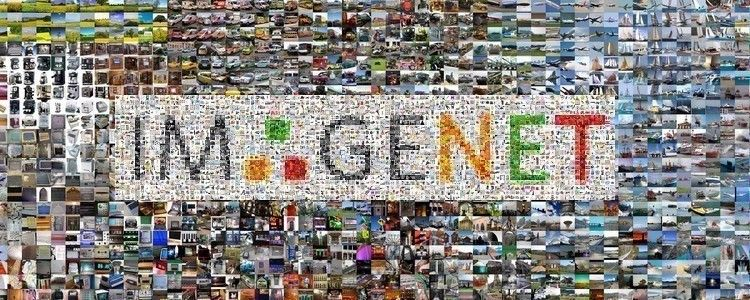

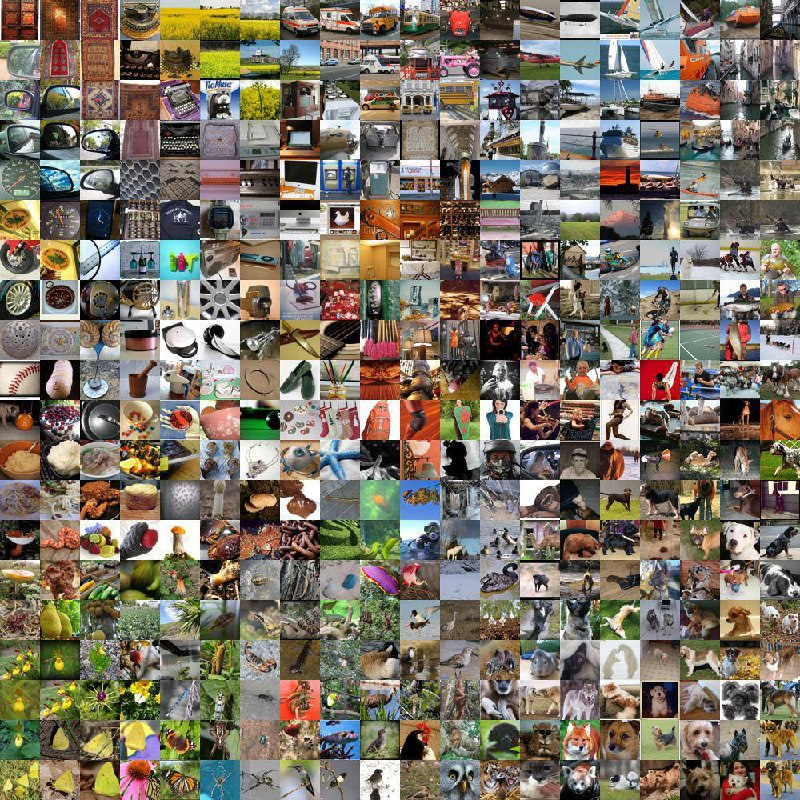

#### `Результаты`

Ниже представлены результаты, которые получалось в разные года, нам важно отметить **появление глубокого обучения** и почему резко **число слоев** увеличилось. Именно об этом мы будем говорить дальше.

Важно, что оценка человеческой точности не совсем честная, так как время для определения  было ограничено и классифицировать изображения редких животных бывает трудно. Не стоит забывать что выбрать подходящий класс из возможных 1000 бывает трудно, как минимум держать в памяти все возможные классы.

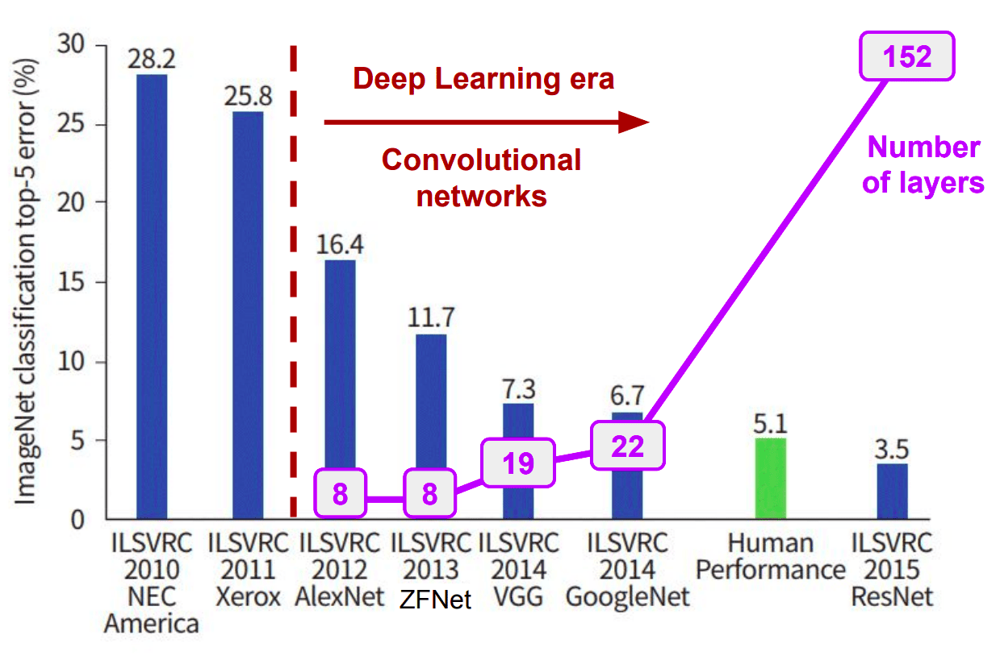

### `AlexNet (2012)`

[Krizhevsky et al., 2012](https://proceedings.neurips.cc/paper/2012/file/c399862d3b9d6b76c8436e924a68c45b-Paper.pdf), примерно 171 тысяча цитат.

Впервые в истории DL попробовали обучить настолько большую сеть, которая даже не влезала на одну GPU, до этого люди сторонились огромных сетей и большого числа параметров.

В начале люди старались учить "глубокие" нейросети, но резко столкнулись с проблемой затухания градиентов, даже при правильных функциях активации. Кроме того, приходилось все изображения приводить к одному размеру, так как полносвязный слой имеет фиксированную размерности входа.

Большая часть вычислительных мощностей тратилась на сверточные блоки, при этом большинство параметров содержалось в линейных слоях.

- Max pooling, в качестве функций активации ReLU
- Dropout и Аугментация изображений для уменьшения переобучения
- 5-6 дней на 2 NVIDIA GTX 580 3GB
- Работает для изображений фиксированного размера


|         | Top-1 Accuracy | Top-5 Accuracy | Num params |
|---------|----------------|----------------|------------|
| AlexNet | 56.522         | 79.066         | 61M        |

*Метрики здесь и далее взяты из реализаций [torchvision](https://pytorch.org/vision/0.20/models.html)*

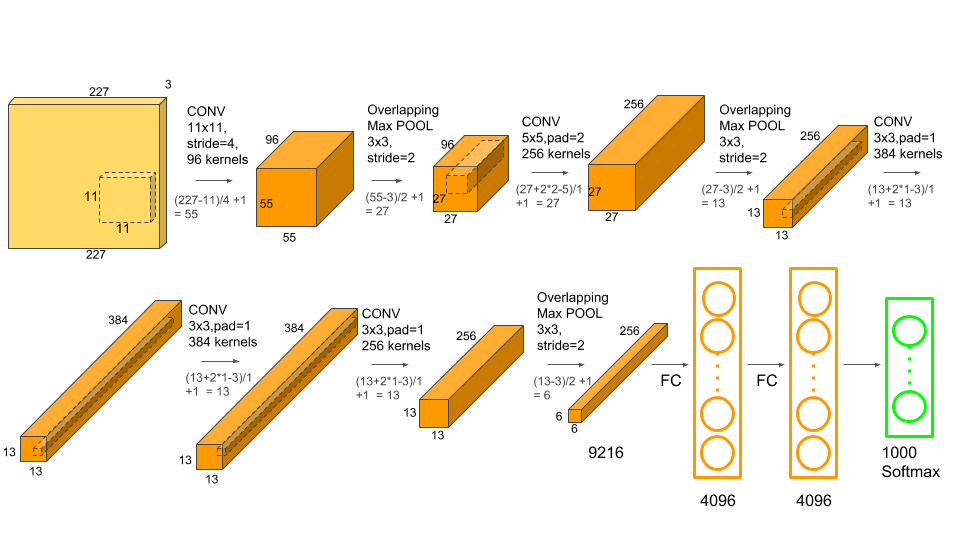

### `VGG (2014)`

[Simonyan and Zisserman, 2014](https://arxiv.org/abs/1409.1556), примерно 140 тысяч цитат. 

При обучении нейросети с глубиной 8 уже начинались проблемы, а обучить 19 слоев крайне трудно. При этом все в области понимали, что чем больше слоев, тем будет выше качество. В работе `VGG` предложили обучать не `end-to-end`, то есть не обучать всю нейросеть сразу. 

Например, мы можем обучить сначала первые 5 слоев, потом следующие и так далее. При этом на первой стадии мы используем 5 слоев, а потом добавляем на них полносвязанную голову.

**Вопрос:** Какие проблемы вы ведете в этом подходе?

В модели `VGG` стандартизировали все свертки (все они с ядром размера 3), благодаря чему большая часть параметров хранится в сверточных слоях, в отличие от `AlexNet`. Ядра с размером 3 требуют мало параметров, извлекают локальные признаки. Например для достижения **receptive field** размера 5, мы можем взять 2 свертки размера 3 (то есть 18 параметров) или одну свертку размера 5 (25 параметров). В случае **кeceptive field** размера 11 эффективность оказывается еще заметнее.

- Visual Geometry Group (University of Oxford)
- Более глубокие сети: версии на 16 и 19 слоев
- Используются свертки с ядром размера 3, привело к более эффективным вычислениям
- Проблема затухания градиентов привела к не end-to-end обучению
- Обучения стадиями
- 2 - 3 недели на 4 NVIDIA Titan Black GPU
- Работает для изображений фиксированного размера

|        | Top-1 Accuracy | Top-5 Accuracy | Num params |
|--------|----------------|----------------|------------|
| VGG-19 | 72.376         | 90.876         | 143.7M     |



*P.S. первый автор выпускник ВМК, [подробнее тут](https://cs.msu.ru/news/3012)*

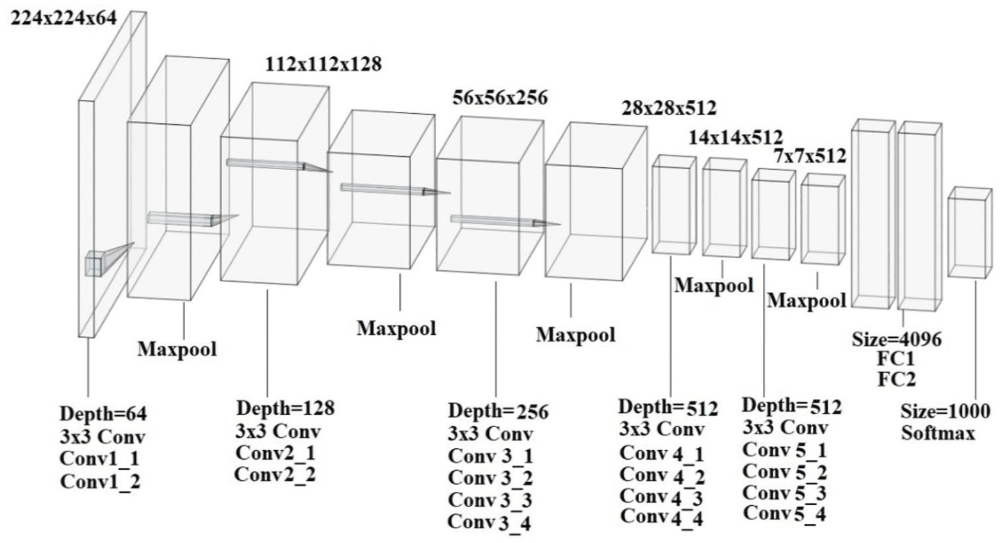

### `GoogLeNet (a.k.a Inception, 2014)`

[Szegedy et al., 2014](https://arxiv.org/abs/1409.4842), примерно 65 тысяч цитат.

Впервые была использована идея применения разных слоев к одному входу, в частности применение разных сверток параллельно к одной `feature map`.

- Параллельные вычислительные блоки (архитектура не последовательная)
- Использование сверток с разными ядром для повышения эффективности
- Не end-to-end обучение, использование вспомогательных классификаторов
- Работает для изображений фиксированного размера

|           | Top-1 Accuracy | Top-5 Accuracy | Num params |
|-----------|----------------|----------------|------------|
| GoogLeNet | 69.778         | 89.530         | 6.6M       |

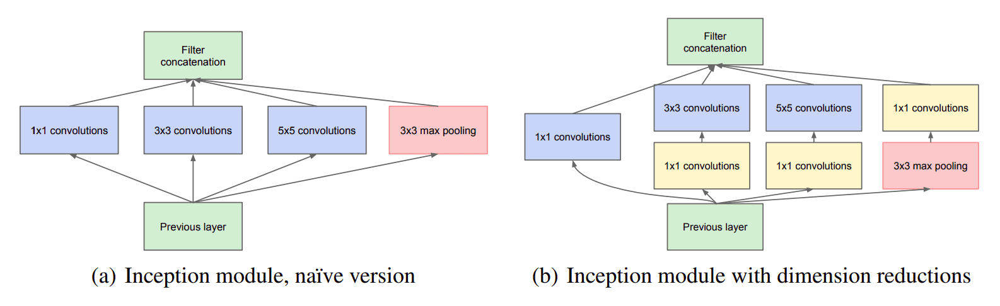

С целью увелечения эффективности и уменьшения параметров используются свертки **с ядром размера 1**, так как благодаря им получается уменьшить число каналов на вход сверткам размера 3 и 5 (уменьшить число параметров в них).

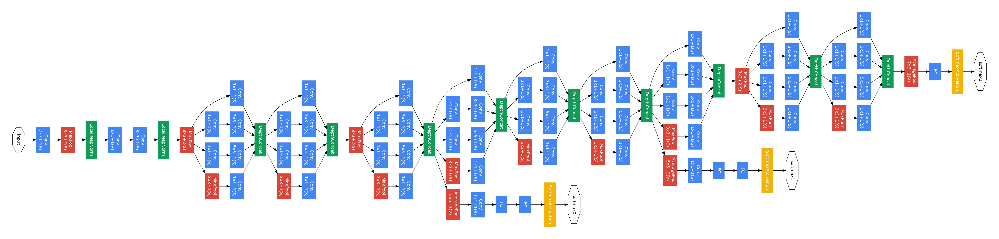

### `Residual (skip) connections`

Все подходы выше старались увеличить число слоев и по-разному решали эту проблему, чаще всего мы отказывались от end-to-end обучения. В этом случае процесс обучения становился сильно сложнее.

В 2015 году появилась, которая поменяла подход к построению архитектур не только в компьютерном зрении, но и в других областях. Ниже представлена схема и **изначальная мотивация** к использованию `skip connections`, а именно решение проблемы затухания градиентов.

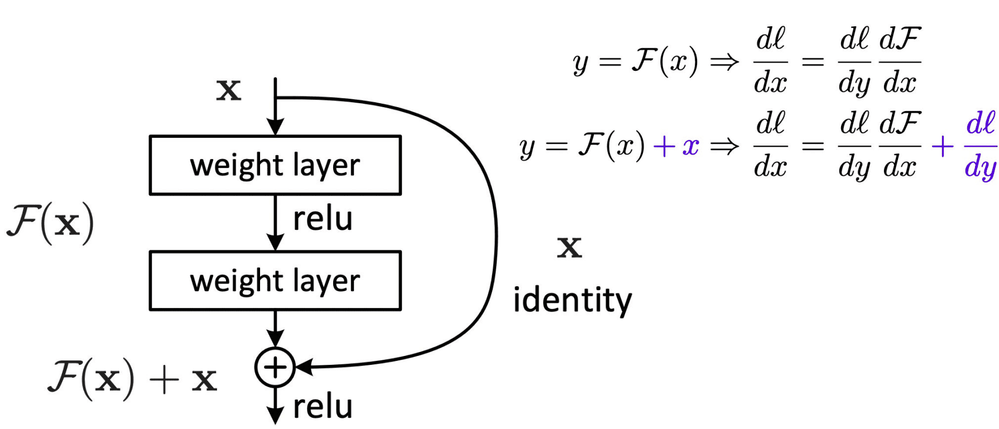

Ниже показан пример `skip connections` в блоке сверточной сети.

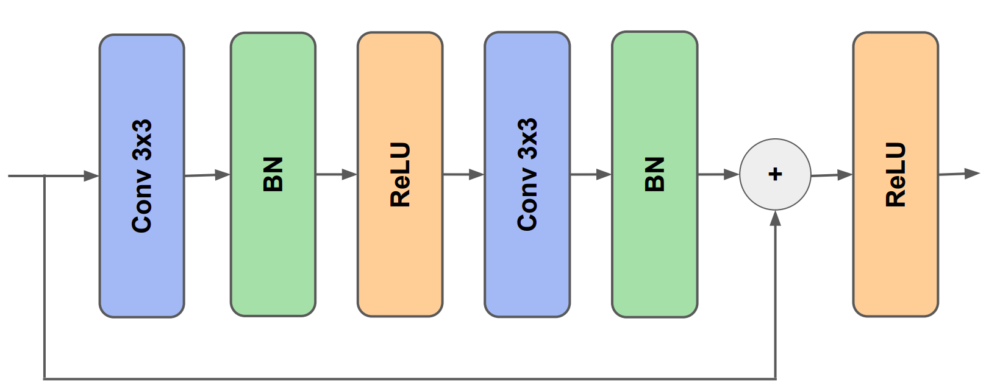

### `ResNet (2015)`

[He et al., 2015](https://arxiv.org/abs/1512.03385), примерно 255 тысяч цитат.

Поход с использованием  `skip connections` позволил обучать нейросети со **152 слоями**.


- **Residual connections** помогает течь градиентам лучше => можно брать сильно больше слоев!!! **stack MUCH MORE layers**
- Использование **batch normalization** для более стабильного обучения
- Вместо **pooling** слоев в блоках использовать свертки с **stride=kernel_size** (как обсуждали ранее)
- **Global average pooling** на последнем слое, то есть на выходе получаем вектор размерности равным числу каналов => обработка изображений любых размеров

**Важно** использование **batch normalization** тоже упрощает обучение более глубоких слоев, например, если добавить батч нормализацию к `VGG`можно обучать `end-to-end`.

|            | Top-1 Accuracy | Top-5 Accuracy | Num params |
|------------|----------------|----------------|------------|
| ResNet-152 | 78.312         | 94.046         | 60.2M      |

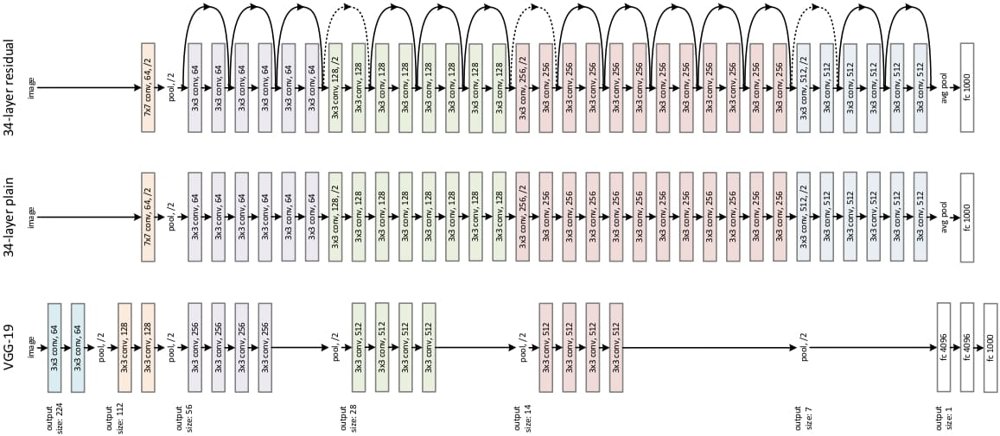

### `Почему skip connections работают? (еще одно объяснение)`

Существуют отдельные направления исследования ландшафта функции потерь нейронной сети (зависимость ошибки от параметров модели). В работе [Li et al., 2017](https://arxiv.org/abs/1712.09913) например изобразили ландшафт функции потерь в архитектуре с `skip connections` и без них.

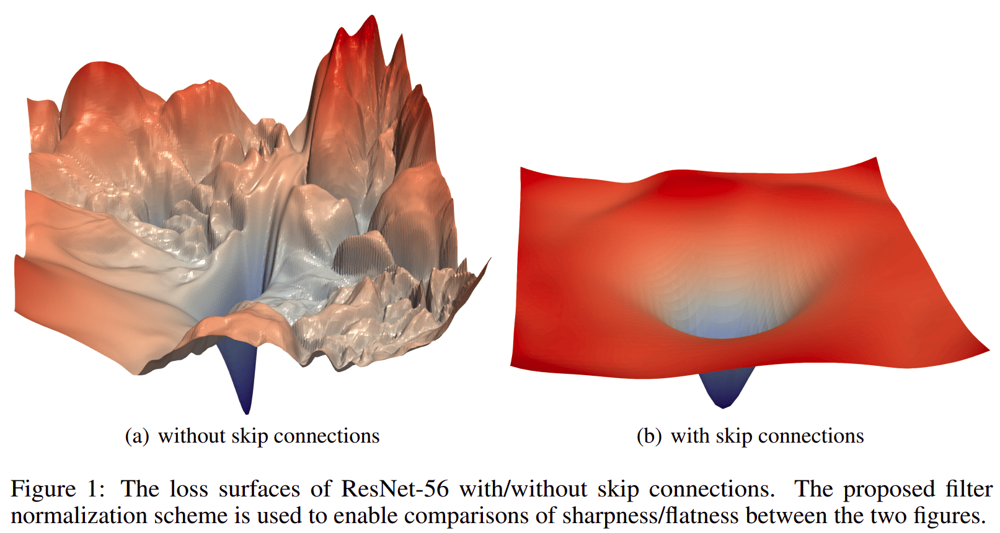

### `Почему skip connections работают? (и еще одно объяснение)`

Можно посмотреть на нейросети со skip connections как некоторый подход к ансамблированию [Veit et al., 2016](https://arxiv.org/abs/1605.06431). Если расписать граф вычислений чуть аккуратней, то можно получить следующую картину:


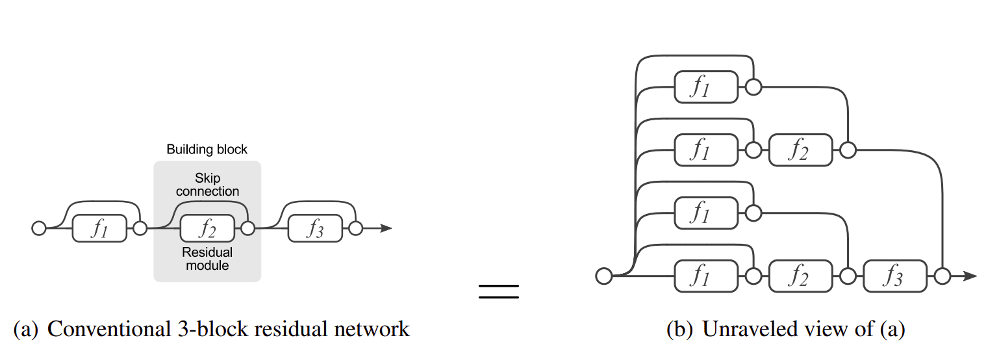

Если мы читаем, что вход равен $y_0$, тогда выход будет равен

$$
\begin{align*}
y_3 &= y_2 + f_3(y_2) \\
   &= [y_1 + f_2(y_1)] + f_3(y_1 + f_2(y_1)) =\\
   &= [y_0 + f_1(y_0)] + f_2(y_0 + f_1(y_0)) + f_3(y_0 + f_1(y_0) + f_2(y_0 + f1(y_0))).
\end{align*}
$$

Такая запись чем-то напоминает градиентный бустинг, а по интуиции из машинного обучения мы знаем, что ансимблирования это хороший способ поднять качество.

### `Результаты`

|            | Top-1 Accuracy | Top-5 Accuracy | Num params |
|------------|----------------|----------------|------------|
| AlexNet    | 56.522         | 79.066         | 61M        |
| VGG-19     | 72.376         | 90.876         | 143.7M     |
| GoogLeNet  | 69.778         | 89.530         | **6.6M**   |
| ResNet-152 | **78.312**     | **94.046**     | 60.2M      |

### `Что было дальше?`

С появлением `ResNet-152` люди научились решать задачу классификации изображений точнее, чем человека*. Следующая цель была заставить мощные классификаторы работать на телефонах и без мощных GPU.  Для этого попробовали много чего, но мы поговорим об этом кратко, так как у нас другие цели. Все желающие могут посмотреть подробнее в [источнике](https://github.com/isadrtdinov/intro-to-dl-hse/blob/1fd3f9bf82fc7aa8e0475210318423559f02f582/lecture-notes/notes-05-cnn.pdf).

Зоопарк моделей:

- DenseNet [Huang et al., 2016](https://arxiv.org/abs/1608.06993): добавили **residual connections** между любыми двумя слоями
- MobileNet [Howard et al,. 2017](https://arxiv.org/abs/1704.04861): подобрали определенные сверточные блоки для эффективной реализации (использование сверток с ядром размера 1)
- NASNet  [Zoph et al,. 2017](https://arxiv.org/abs/1707.07012): обучили умный перебор (Neural Architecture Search) всех возможных архитектур из заранее заданных блоков (об этом подробнее в следующем семестре)
- EfficientNet [Tan and Le, 2019](https://arxiv.org/abs/1905.11946): использовали NAS на блоках на специальных блоках, mobile NAS


Результаты 2019 года представлены на графике ниже, важно отметить, что рассматриваемые модели это именно сверточные архитектуры.


*в специальных условиях, с некоторыми ограничениями по времени

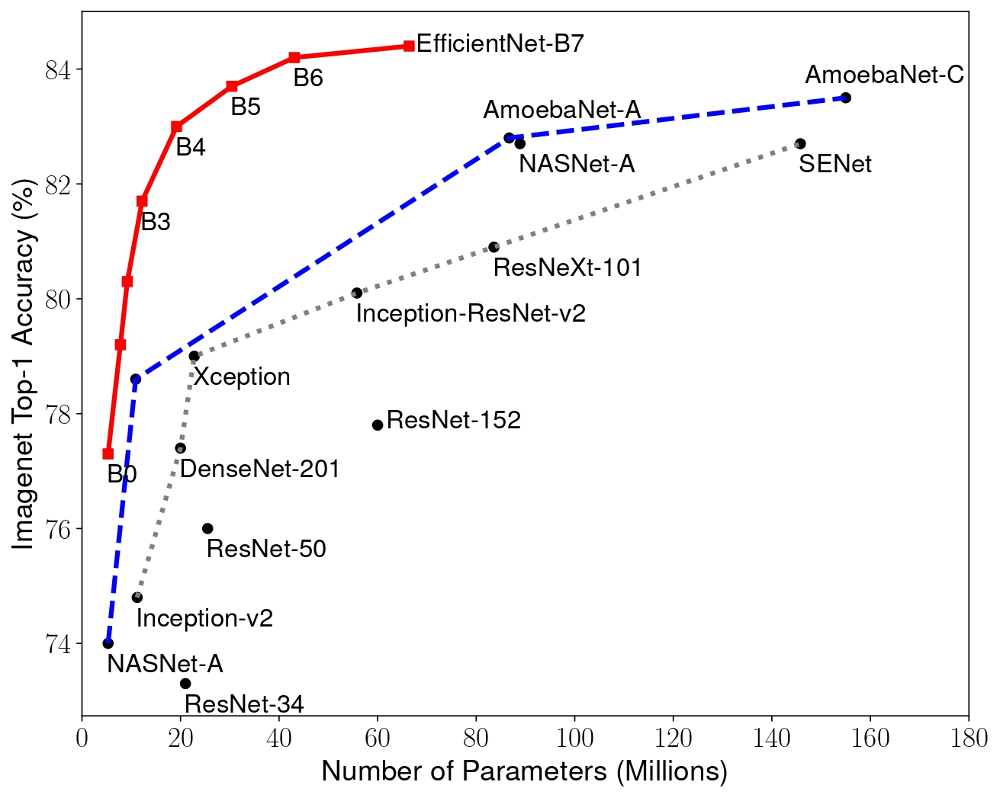

### `Не сверточные модели`

Текущая SOTA в классификации изображений принадлежит трансформерам, но об этом мы погорим в следующих лекциях. Не смотря, на проигрыш в качестве лучшей модели, сверточные сети все еще очень популярны.

Основные преимущества сверточных архитектур:

- Быстрее и проще учатся

- Более эффективные по вычислениям

- Хорошо работают на малых данных

Кроме того, сверточные сети можно использовать для обработки аудио или иных числовых последовательностей. Также есть подходы и идеи, как сделать использовать идеи из трансформеров в сверточных архитектурах, например статья [Liu et al., 2022](https://arxiv.org/abs/2201.03545).


Отметим, что идеи и знания, которые получили люди при решении задачи классификации изображений часто переносят и на текущие работы. Например, почти все современные архитектуры используют **skip connections**, встречаются методы не использующие **end-to-end** обучение.

#### `Судьба ImageNet`

К сожалению, со временем стало появляться все больше инженерных работ, в которых отсуствовали новые и интересные идеи. Люди стали гнаться за сотыми процентов и плодить кучу разных архитектур разной степени красивости. Ниже представлены основные результаты в области.

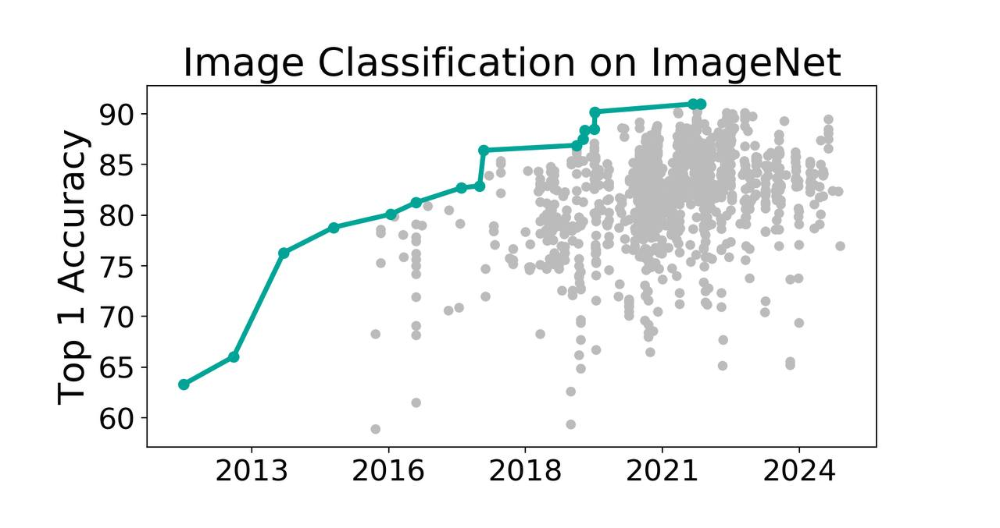

## `Transfer learning`

Весь рассказ выше строился вокруг датасета `ImageNet` в котором более миллиона изображений. Часто не бывает в наличии настолько большой обучающей выборки, а обучать большие модели на маленьком объеме данных очень трудно и приводит к переобучению.

Для решения этой задачи существует подход `transfer learning`. Мы будем использовать уже предобученные модели в качестве при решении своей конкретной задачи (например, классификация листьев деревьев).

### `Pre-training (предобучение)`

Для начала обучим модель на какой-то общей задаче (большом объеме данных, например, `ImageNet`). Мы предполагаем, что модель научилась извлекать признаки, которые хорошо обобщаются на схожие данные (например, на `Cifar10`). Так как модель не переобучилась и показывает хорошее качество на тесте, у нас есть надежда на обобщающую способность.

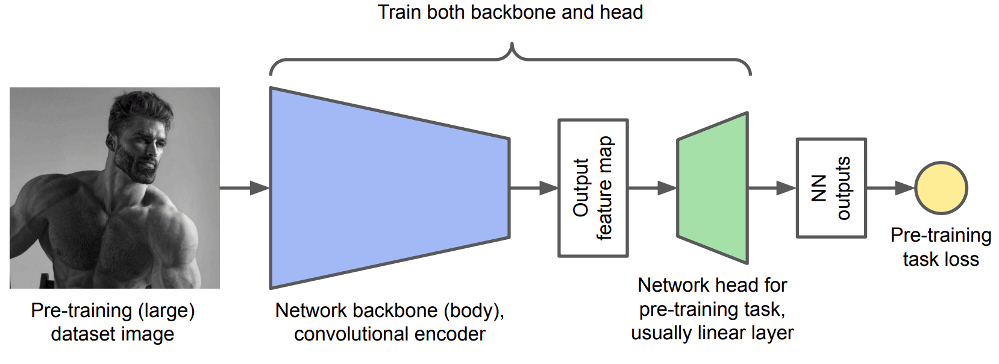

### `Linear probing`

Далее возьмем предобученную модель и заморозим все веса. Мы уже знаем, что модель извлекла хорошие признаки, значит на них мы можем обучить MLP/линейный слой. Для этого мы заменим в модели линейный слой (так как число классов скорее всего поменялось), заморозим все остальные веса и будем обучать модель.




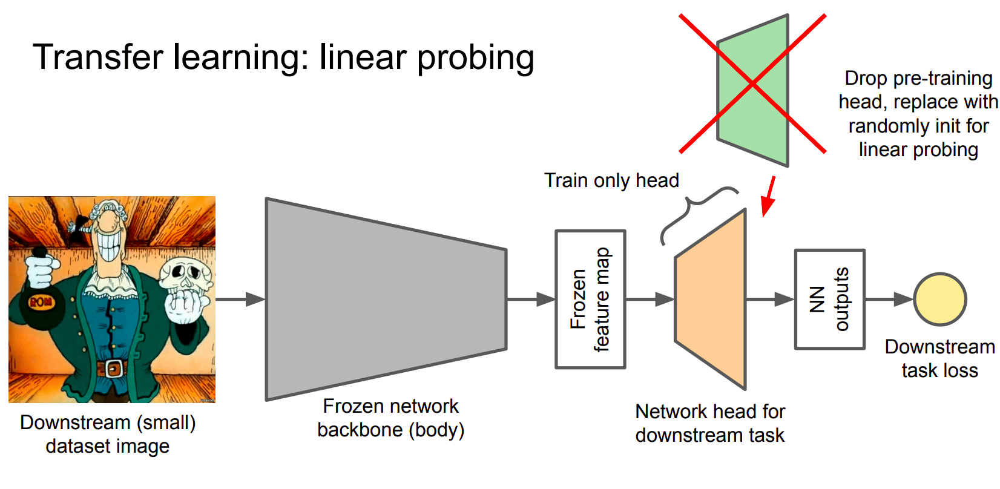

### `Finetuning`

Мы также заменяем голову модели (линейный слой) с целью предсказания нужного числа классов, но будем обучать всю модель целиком. Идейно мы обучаемся не со случайной инициализации весов, а в окрестности какого-то "достаточно хорошего" минимума. Есть отдельные работы по исследованию минимумов и как именно нужно обучать модель в таком режиме.



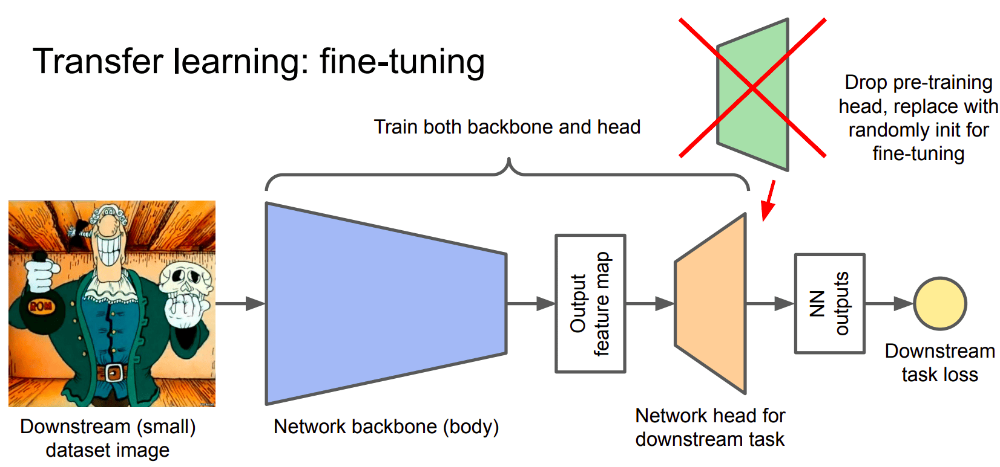

Рассмотренные подходы можно комбинировать, например заморозить только первые слои, а обучать остальные и тому подобное.

**Вопрос:** В каком режиме обучения модель больше подвержена переобучению?
    
**Вопрос:** В каком режиме можно найти более хорошее решение задачи, то есть выбить выше качество?
    


## `Итоги`

- Модели, которые используют знания о данных (`Inductive bias`) работают лучше
- Наличие и создание единых бэнчмарков позволяет области развиваться
- Методы и подходы из компьютерного зрения переиспользовались в других областях и наоборот
- Решение сложных задач на больших датасетах позволяет получать хорошие результаты и на маленьких выборках